# Welcome! To Code execution testing colab for Data Analysis Tasks!
### How to use
1. Make a copy of this file (*File -> Save copy in drive*).
2. Rename your copy whit this convention:
  1. *( id for the task ).ipynb*
  2. For example: *DCA1.ipynb*
2. Install the libraries.
3. Open the [Drive in the sheets](https://drive.google.com/drive/folders/1a7_txX6YoAqOqI7XBxg4B7VqOerrm_dn)
4. Read the instructions for mount this Drive.
5. Create your code according to the instructions.
6. When you finish, run the code, and save the colab (Ctrl + s).
7. Go to Share --> *Select **Anyone with the link** --> Editor*
8. Paste the link to the colab in the sheets for tasking in the column **Colab Link**

### Useful Docs
1. [Matplotlib usage examples](https://colab.research.google.com/notebooks/charts.ipynb#scrollTo=xNzEBRkzL3B0)
2. [PEP8-Style Guide For Python](https://peps.python.org/pep-0008/)


In [ ]:
!pip install matplotlib mpmath numpy pandas sympy bokeh

## Code Execution
When you make the copy, you can use the code block below to execute your code.

## How to Add shared folder with me on personal gdrive.


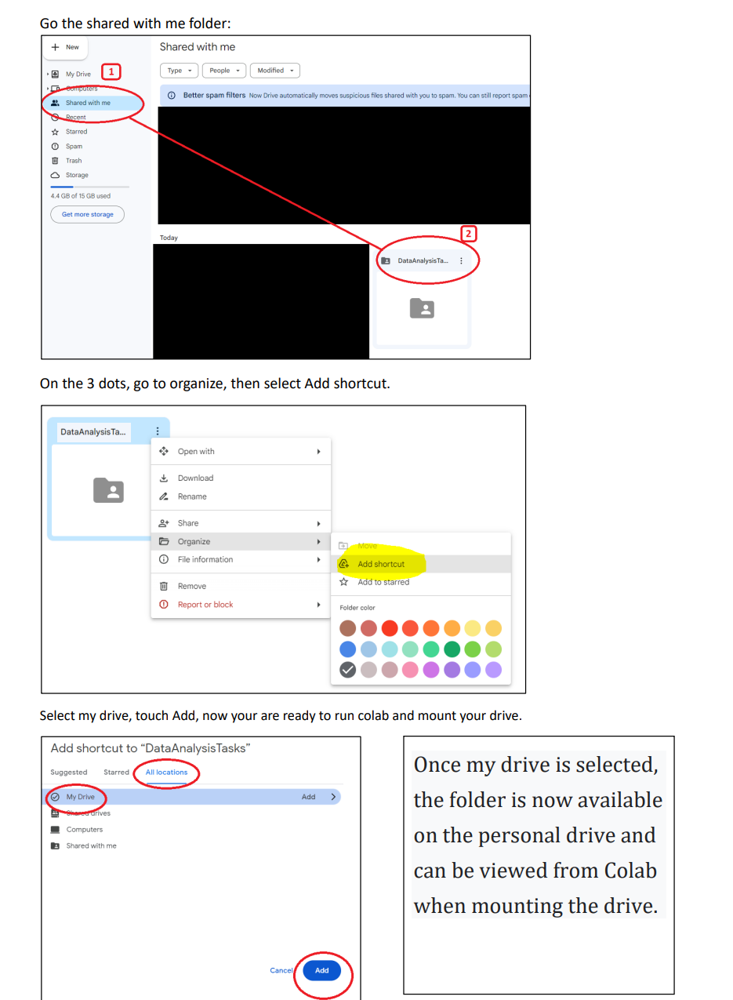

In [1]:
from google.colab import drive

drive.mount("/content/gdrive", force_remount=True)


Mounted at /content/gdrive


EXAMPLE FOR TEST THE CORRECT MOUNT OF GDRIVE

In [14]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

try:
    # Read the workout data from the CSV file
    df = pd.read_csv("/content/gdrive/MyDrive/DataAnalysisTasks/Datasets/sanfrancisco_crimes_data_2016.csv", parse_dates=['Date'])
    df.head()
    print("CSV file loaded successfully, you can start working right now")
except Exception as e:
    print(f"An error occurred while loading the CSV file: {e}, please check the correct mount of the shared folder")


CSV file loaded successfully, you can start working right now


## For interactive Bokeh plot this code has to be inside the cell of the Bokeh code.

In [ ]:
from bokeh.io import output_notebook
output_notebook()

-------------------------------------------------------------------------------------------------------------------




---



**AFTER THIS POINT YOU CAN START WORKING**

---








* Prompt: Write a Python code to create an interactive plot where all the longitude and latitude of Crime of categories, STOLEN PROPERTY, DRUNKENNESS, RECOVERED VEHICLE, DISORDERLY CONDUCT and SUICIDE are plotted. The plot should be separated by tabs and the name of the categories should be on the tab. There should be a lasso tool to select points and highlight the selected plot. There should also be a reset button. When hovering on any point, it should be emphasized, and the value of the point must be shown. Finally show the output.

In [20]:
# Import Libraries
from bokeh.io import output_notebook
from bokeh.plotting import figure, show
from bokeh.models import (
    ColumnDataSource,
    Tabs,
    TabPanel,
    HoverTool,
    CDSView,
    GroupFilter,
)
from bokeh.layouts import gridplot, column
import warnings

# Ignoring Warnings
warnings.filterwarnings("ignore")

# Droping rows that has Null Category Value
df = df.dropna(subset=["Category"])

# Droping rows that has Null Latitude or Longitude Value
df = df.dropna(subset=["X", "Y"])
cols = ["X", "Y"]

# Converting String to Numeric Data
df[cols] = df[cols].apply(pd.to_numeric, errors="coerce", axis=1)

# Selecting Data based on Catagory
STOLEN_PROPERTY = df[df["Category"] == "STOLEN PROPERTY"]
STOLEN_PROPERTY_cds = ColumnDataSource(STOLEN_PROPERTY)
RECOVERED_VEHICLE = df[df["Category"] == "RECOVERED VEHICLE"]
RECOVERED_VEHICLE_cds = ColumnDataSource(RECOVERED_VEHICLE)
DISORDERLY_CONDUCT = df[df["Category"] == "DISORDERLY CONDUCT"]
DISORDERLY_CONDUCT_cds = ColumnDataSource(DISORDERLY_CONDUCT)
SUICIDE = df[df["Category"] == "SUICIDE"]
SUICIDE_cds = ColumnDataSource(SUICIDE)
DRUNKENNESS = df[df["Category"] == "DRUNKENNESS"]
DRUNKENNESS_cds = ColumnDataSource(DRUNKENNESS)

output_notebook()

# Selection Tools
select_tools = ["hover", "lasso_select", "box_zoom", "reset", "save"]

# Defining Figure
DRUNKENNESS_fig = figure(
    height=600,
    width=600,
    title="DRUNKENNESS",
    x_axis_label="Latitude",
    y_axis_label="Longitude",
    toolbar_location="below",
    tools=select_tools,
)
DRUNKENNESS_fig.circle(
    x="X",
    y="Y",
    source=DRUNKENNESS_cds,
    color="royalblue",
    size=5,
    alpha=0.5,
    selection_color="deepskyblue",
    nonselection_color="lightgray",
    nonselection_alpha=0.3,
)

# Configure render to be used as hover
hover_glyph = DRUNKENNESS_fig.circle(
    x="X",
    y="Y",
    source=DRUNKENNESS_cds,
    size=10,
    alpha=0,
    hover_fill_color="black",
    hover_alpha=0.3,
)
DRUNKENNESS_fig.add_tools(HoverTool(renderers=[hover_glyph]))


STOLEN_PROPERTY_fig = figure(
    height=600,
    width=600,
    title="STOLEN PROPERTY",
    x_axis_label="Latitude",
    y_axis_label="Longitude",
    toolbar_location="below",
    tools=select_tools,
)
STOLEN_PROPERTY_fig.circle(
    x="X",
    y="Y",
    source=STOLEN_PROPERTY_cds,
    color="brown",
    size=5,
    alpha=0.5,
    selection_color="sandybrown",
    nonselection_color="lightgray",
    nonselection_alpha=0.3,
)
hover_glyph = STOLEN_PROPERTY_fig.circle(
    x="X",
    y="Y",
    source=STOLEN_PROPERTY_cds,
    size=10,
    alpha=0,
    hover_fill_color="black",
    hover_alpha=0.3,
)
STOLEN_PROPERTY_fig.add_tools(HoverTool(renderers=[hover_glyph]))

RECOVERED_VEHICLE_fig = figure(
    height=600,
    width=600,
    title="RECOVERED VEHICLE",
    x_axis_label="Latitude",
    y_axis_label="Longitude",
    toolbar_location="below",
    tools=select_tools,
)
RECOVERED_VEHICLE_fig.circle(
    x="X",
    y="Y",
    source=RECOVERED_VEHICLE_cds,
    color="darkturquoise",
    size=5,
    alpha=0.5,
    selection_color="cyan",
    nonselection_color="lightgray",
    nonselection_alpha=0.3,
)
hover_glyph = RECOVERED_VEHICLE_fig.circle(
    x="X",
    y="Y",
    source=RECOVERED_VEHICLE_cds,
    size=10,
    alpha=0,
    hover_fill_color="black",
    hover_alpha=0.3,
)
RECOVERED_VEHICLE_fig.add_tools(HoverTool(renderers=[hover_glyph]))

DISORDERLY_CONDUCT_fig = figure(
    height=600,
    width=600,
    title="DISORDERLY CONDUCT",
    x_axis_label="Latitude",
    y_axis_label="Longitude",
    toolbar_location="below",
    tools=select_tools,
)
DISORDERLY_CONDUCT_fig.circle(
    x="X",
    y="Y",
    source=DISORDERLY_CONDUCT_cds,
    color="green",
    size=5,
    alpha=0.5,
    selection_color="lime",
    nonselection_color="lightgray",
    nonselection_alpha=0.3,
)
hover_glyph = DISORDERLY_CONDUCT_fig.circle(
    x="X",
    y="Y",
    source=DISORDERLY_CONDUCT_cds,
    size=10,
    alpha=0,
    hover_fill_color="black",
    hover_alpha=0.3,
)
DISORDERLY_CONDUCT_fig.add_tools(HoverTool(renderers=[hover_glyph]))

SUICIDE_fig = figure(
    height=600,
    width=600,
    title="SUICIDE",
    x_axis_label="Latitude",
    y_axis_label="Longitude",
    toolbar_location="below",
    tools=select_tools,
)
SUICIDE_fig.circle(
    x="X",
    y="Y",
    source=SUICIDE_cds,
    color="orange",
    size=10,
    alpha=0.5,
    selection_color="orangered",
    nonselection_color="lightgray",
    nonselection_alpha=0.3,
)
hover_glyph = SUICIDE_fig.circle(
    x="X",
    y="Y",
    source=SUICIDE_cds,
    size=10,
    alpha=0,
    hover_fill_color="black",
    hover_alpha=0.3,
)
SUICIDE_fig.add_tools(HoverTool(renderers=[hover_glyph]))

# Creating Tabs
DRUNKENNESS_tab = TabPanel(child=DRUNKENNESS_fig, title="DRUNKENNESS")
STOLEN_PROPERTY_tab = TabPanel(child=STOLEN_PROPERTY_fig, title="STOLEN PROPERTY")
RECOVERED_VEHICLE_tab = TabPanel(child=RECOVERED_VEHICLE_fig, title="RECOVERED VEHICLE")
DISORDERLY_CONDUCT_tab = TabPanel(
    child=DISORDERLY_CONDUCT_fig, title="DISORDERLY CONDUCT"
)
SUICIDE_tab = TabPanel(child=SUICIDE_fig, title="SUICIDE")

tabs = Tabs(
    tabs=[
        DRUNKENNESS_tab,
        STOLEN_PROPERTY_tab,
        RECOVERED_VEHICLE_tab,
        DISORDERLY_CONDUCT_tab,
        SUICIDE_tab,
    ]
)

show(tabs)

In [ ]:
# Import Libraries
from bokeh.io import output_notebook
from bokeh.plotting import figure, show
from bokeh.models import (
    ColumnDataSource,
    Tabs,
    TabPanel,
    HoverTool,
    CDSView,
    GroupFilter,
)
from bokeh.layouts import gridplot, column
import warnings

# Ignoring Warnings
warnings.filterwarnings("ignore")

# Droping rows that has Null Country Value
df = df.dropna(subset=["country"])

# Droping rows that has Null Latitude or Longitude Value
df = df.dropna(subset=["latitude", "longitude"])
cols = ["latitude", "longitude"]

# Converting String to Numeric Data
df[cols] = df[cols].apply(pd.to_numeric, errors="coerce", axis=1)

# Sorting Data
df = df.sort_values(["country", "Date_time"])

# Selecting Data based on Country
us_data = df[df["country"] == "us"]
us_cds = ColumnDataSource(us_data)
gb_data = df[df["country"] == "gb"]
gb_cds = ColumnDataSource(gb_data)
ca_data = df[df["country"] == "ca"]
ca_cds = ColumnDataSource(ca_data)
au_data = df[df["country"] == "au"]
au_cds = ColumnDataSource(au_data)
de_data = df[df["country"] == "de"]
de_cds = ColumnDataSource(de_data)

output_notebook()

# Selection Tools
select_tools = ["hover", "lasso_select", "box_zoom", "reset", "save"]

# Defining Figure
us_fig = figure(
    height=600,
    width=600,
    title="USA UFO Sighting",
    x_axis_label="Latitude",
    y_axis_label="Longitude",
    toolbar_location="below",
    tools=select_tools,
)
us_fig.circle(
    x="latitude",
    y="longitude",
    source=us_cds,
    color="royalblue",
    size=5,
    alpha=0.5,
    selection_color="deepskyblue",
    nonselection_color="lightgray",
    nonselection_alpha=0.3,
)

# Configure render to be used as hover
hover_glyph = us_fig.circle(
    x="latitude",
    y="longitude",
    source=us_cds,
    size=10,
    alpha=0,
    hover_fill_color="black",
    hover_alpha=0.3,
)
us_fig.add_tools(HoverTool(renderers=[hover_glyph]))

gb_fig = figure(
    height=600,
    width=600,
    title="UK UFO Sighting",
    x_axis_label="Latitude",
    y_axis_label="Longitude",
    toolbar_location="below",
    tools=select_tools,
)
gb_fig.circle(
    x="latitude",
    y="longitude",
    source=gb_cds,
    color="brown",
    size=5,
    alpha=0.5,
    selection_color="sandybrown",
    nonselection_color="lightgray",
    nonselection_alpha=0.3,
)
hover_glyph = gb_fig.circle(
    x="latitude",
    y="longitude",
    source=gb_cds,
    size=10,
    alpha=0,
    hover_fill_color="black",
    hover_alpha=0.3,
)
gb_fig.add_tools(HoverTool(renderers=[hover_glyph]))

ca_fig = figure(
    height=600,
    width=600,
    title="Canada UFO Sighting",
    x_axis_label="Latitude",
    y_axis_label="Longitude",
    toolbar_location="below",
    tools=select_tools,
)
ca_fig.circle(
    x="latitude",
    y="longitude",
    source=ca_cds,
    color="darkturquoise",
    size=5,
    alpha=0.5,
    selection_color="cyan",
    nonselection_color="lightgray",
    nonselection_alpha=0.3,
)
hover_glyph = ca_fig.circle(
    x="latitude",
    y="longitude",
    source=ca_cds,
    size=10,
    alpha=0,
    hover_fill_color="black",
    hover_alpha=0.3,
)
ca_fig.add_tools(HoverTool(renderers=[hover_glyph]))

au_fig = figure(
    height=600,
    width=600,
    title="Austrelia UFO Sighting",
    x_axis_label="Latitude",
    y_axis_label="Longitude",
    toolbar_location="below",
    tools=select_tools,
)
au_fig.circle(
    x="latitude",
    y="longitude",
    source=au_cds,
    color="green",
    size=5,
    alpha=0.5,
    selection_color="lime",
    nonselection_color="lightgray",
    nonselection_alpha=0.3,
)
hover_glyph = au_fig.circle(
    x="latitude",
    y="longitude",
    source=au_cds,
    size=10,
    alpha=0,
    hover_fill_color="black",
    hover_alpha=0.3,
)
au_fig.add_tools(HoverTool(renderers=[hover_glyph]))

de_fig = figure(
    height=600,
    width=600,
    title="Germany UFO Sighting",
    x_axis_label="Latitude",
    y_axis_label="Longitude",
    toolbar_location="below",
    tools=select_tools,
)
de_fig.circle(
    x="latitude",
    y="longitude",
    source=de_cds,
    color="orange",
    size=10,
    alpha=0.5,
    selection_color="orangered",
    nonselection_color="lightgray",
    nonselection_alpha=0.3,
)
hover_glyph = de_fig.circle(
    x="latitude",
    y="longitude",
    source=de_cds,
    size=10,
    alpha=0,
    hover_fill_color="black",
    hover_alpha=0.3,
)
de_fig.add_tools(HoverTool(renderers=[hover_glyph]))

# Creating Tabs
us_tab = TabPanel(child=us_fig, title="USA")
gb_tab = TabPanel(child=gb_fig, title="GB")
ca_tab = TabPanel(child=ca_fig, title="CA")
au_tab = TabPanel(child=au_fig, title="AU")
de_tab = TabPanel(child=de_fig, title="DE")

tabs = Tabs(tabs=[de_tab, us_tab, gb_tab, ca_tab, au_tab])

show(tabs)